# Ejemplo de análisis espacial: riqueza de especies

## Introducción

La [riqueza de especies](https://es.wikipedia.org/wiki/Riqueza_de_especies) es el número total de especies que se encuentran en un hábitat, ecosistema, paisaje, área o región determinada.

En este cuaderno de notas se muestra la riqueza de especies de [félidos (familia *Felidae*)](https://es.wikipedia.org/wiki/Felidae) en áreas de conservación de Costa Rica.

## Carga de bibliotecas

In [1]:
# Carga de geopandas con el alias gdp
import geopandas as gpd

# Otras bibliotecas

# Carga de pandas con el alias pd
import pandas as pd

# Carga del módulo pyplot de matplotlib con el alias plt
import matplotlib.pyplot as plt

# Carga de la clase WebFeatureService del módulo wfs de owslib
# Permite interactuar con servicios web geoespaciales tipo WFS
from owslib.wfs import WebFeatureService

# Carga de la clase BytesIO del módulo estándar io
# Permite crear un objeto en memoria que actúa como un archivo binario
from io import BytesIO

# Carga de la biblioteca Folium, para mapas interactivos
import folium

## Carga de datos

In [2]:
# Crear un dataframe con registros de presencia de félidos
felidos_df = pd.read_csv(
    'https://raw.githubusercontent.com/gf0657-programacionsig/2024-ii/refs/heads/main/datos/gbif/gbif-felidos-cri.csv',
    sep='\t'
)

# Reducción de columnas
felidos_df = felidos_df[['species', 'decimalLongitude', 'decimalLatitude']]

# Crear un geodataframe a partir del dataframe
felidos_gdf = gpd.GeoDataFrame(
    felidos_df, 
    geometry=gpd.points_from_xy(felidos_df.decimalLongitude, felidos_df.decimalLatitude),
    crs='EPSG:4326'
)

# Mostrar los primeros registros del geodataframe
felidos_gdf.head()

,species,decimalLongitude,decimalLatitude,geometry
0,Leopardus pardalis,-83.530469,10.595040,POINT (-83.53047 10.59504)
1,Panthera onca,-84.000000,9.950000,POINT (-84 9.95)
2,Panthera onca,-85.050000,10.968080,POINT (-85.05 10.96808)
3,Leopardus wiedii,-85.624341,10.370696,POINT (-85.62434 10.3707)
4,Leopardus pardalis,-82.858061,9.740033,POINT (-82.85806 9.74003)


In [3]:
# Valores únicos de la columna species
felidos_gdf['species'].unique()

array(['Leopardus pardalis', 'Panthera onca', 'Leopardus wiedii',
       'Puma concolor', 'Puma yagouaroundi', 'Leopardus tigrinus'],
      dtype=object)

In [4]:
# Conexión al servicio WFS del Sinac
wfs_url = 'http://geos1pne.sirefor.go.cr/wfs'
wfs_version = '1.1.0'
wfs = WebFeatureService(url=wfs_url, version=wfs_version)

# Obtener la capa de áreas de conservación
capa = 'PNE:areas_conservacion'
respuesta = wfs.getfeature(typename=capa, outputFormat='application/json')

# Leer la respuesta en un GeoDataFrame
areas_conservacion_gdf = gpd.read_file(BytesIO(respuesta.read()))

# Reducción de columnas
areas_conservacion_gdf = areas_conservacion_gdf[['id', 'siglas_ac', 'nombre_ac', 'geometry']]

# Definir un índice
areas_conservacion_gdf.set_index('id', inplace=True)

# Reproyectar a WGS84
areas_conservacion_wgs84_gdf = areas_conservacion_gdf.to_crs(epsg=4326)

# Mostrar el GeoDataFrame
areas_conservacion_wgs84_gdf

,siglas_ac,nombre_ac,geometry
id,,,
areas_conservacion.1,ACOSA,Osa,"POLYGON ((-82.90321 8.73373, -82.90317 8.73357..."
areas_conservacion.2,ACT,Tempisque,"POLYGON ((-85.43351 10.44009, -85.43309 10.439..."
areas_conservacion.3,ACG,Guanacaste,"POLYGON ((-85.35777 11.12637, -85.22911 11.063..."
areas_conservacion.4,ACTo,Tortuguero,"POLYGON ((-83.69448 10.93883, -83.69312 10.938..."
areas_conservacion.5,ACLAP,La Amistad Pacifico,"POLYGON ((-83.49122 9.61393, -83.44427 9.61357..."
areas_conservacion.6,ACOPAC,Pacifico Central,"POLYGON ((-84.82622 10.33726, -84.82587 10.337..."
areas_conservacion.7,ACC,Central,"POLYGON ((-84.01143 10.44435, -84.01105 10.444..."
areas_conservacion.8,ACAHN,Huetar Norte,"MULTIPOLYGON (((-84.08375 10.29133, -84.08375 ..."
areas_conservacion.9,ACAT,Arenal Tempisque,"POLYGON ((-85.09671 10.78235, -85.09685 10.746..."


## Análisis

In [5]:
# Unión espacial
felidos_ac_gdf = felidos_gdf.sjoin(
    areas_conservacion_wgs84_gdf, 
    predicate='intersects'
)

felidos_ac_gdf.head()

,species,decimalLongitude,decimalLatitude,geometry,id,siglas_ac,nombre_ac
0,Leopardus pardalis,-83.530469,10.595040,POINT (-83.53047 10.59504),areas_conservacion.4,ACTo,Tortuguero
1,Panthera onca,-84.000000,9.950000,POINT (-84 9.95),areas_conservacion.7,ACC,Central
2,Panthera onca,-85.050000,10.968080,POINT (-85.05 10.96808),areas_conservacion.8,ACAHN,Huetar Norte
3,Leopardus wiedii,-85.624341,10.370696,POINT (-85.62434 10.3707),areas_conservacion.2,ACT,Tempisque
4,Leopardus pardalis,-82.858061,9.740033,POINT (-82.85806 9.74003),areas_conservacion.10,ACLAC,La Amistad Caribe


In [6]:
# Conteo de especies en cada ASP
conteo_especies_por_ac = felidos_ac_gdf.groupby("id").species.nunique()

# Convertir la serie a dataframe
conteo_especies_por_ac = conteo_especies_por_ac.reset_index()

# Definir un índice
conteo_especies_por_ac.set_index('id', inplace=True)

# Cambio de nombre de columna
conteo_especies_por_ac.rename(columns = {'species': 'especies_felidos'}, inplace = True)

# Despliegue de áreas de conservación por cantidad de especies
conteo_especies_por_ac.sort_values(by="especies_felidos", ascending=False)

,especies_felidos
id,
areas_conservacion.7,6
areas_conservacion.1,5
areas_conservacion.9,5
areas_conservacion.10,4
areas_conservacion.2,4
areas_conservacion.3,4
areas_conservacion.6,4
areas_conservacion.8,4
areas_conservacion.5,3


In [7]:
# Join para agregar la columna con el conteo a la capa de áreas de conservación
areas_conservacion_wgs84_gdf = areas_conservacion_wgs84_gdf.join(conteo_especies_por_ac)

areas_conservacion_wgs84_gdf.sort_values(by='especies_felidos', ascending=False)

,siglas_ac,nombre_ac,geometry,especies_felidos
id,,,,
areas_conservacion.7,ACC,Central,"POLYGON ((-84.01143 10.44435, -84.01105 10.444...",6
areas_conservacion.1,ACOSA,Osa,"POLYGON ((-82.90321 8.73373, -82.90317 8.73357...",5
areas_conservacion.9,ACAT,Arenal Tempisque,"POLYGON ((-85.09671 10.78235, -85.09685 10.746...",5
areas_conservacion.2,ACT,Tempisque,"POLYGON ((-85.43351 10.44009, -85.43309 10.439...",4
areas_conservacion.3,ACG,Guanacaste,"POLYGON ((-85.35777 11.12637, -85.22911 11.063...",4
areas_conservacion.6,ACOPAC,Pacifico Central,"POLYGON ((-84.82622 10.33726, -84.82587 10.337...",4
areas_conservacion.8,ACAHN,Huetar Norte,"MULTIPOLYGON (((-84.08375 10.29133, -84.08375 ...",4
areas_conservacion.10,ACLAC,La Amistad Caribe,"MULTIPOLYGON (((-83.5426 9.97478, -83.54267 9....",4
areas_conservacion.5,ACLAP,La Amistad Pacifico,"POLYGON ((-83.49122 9.61393, -83.44427 9.61357...",3


/home/mfvargas/miniconda3/envs/gf0657-2024-ii/lib/python3.12/site-packages/mapclassify/classifiers.py:1653: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  self.bins = quantile(y, k=k)


<Axes: >

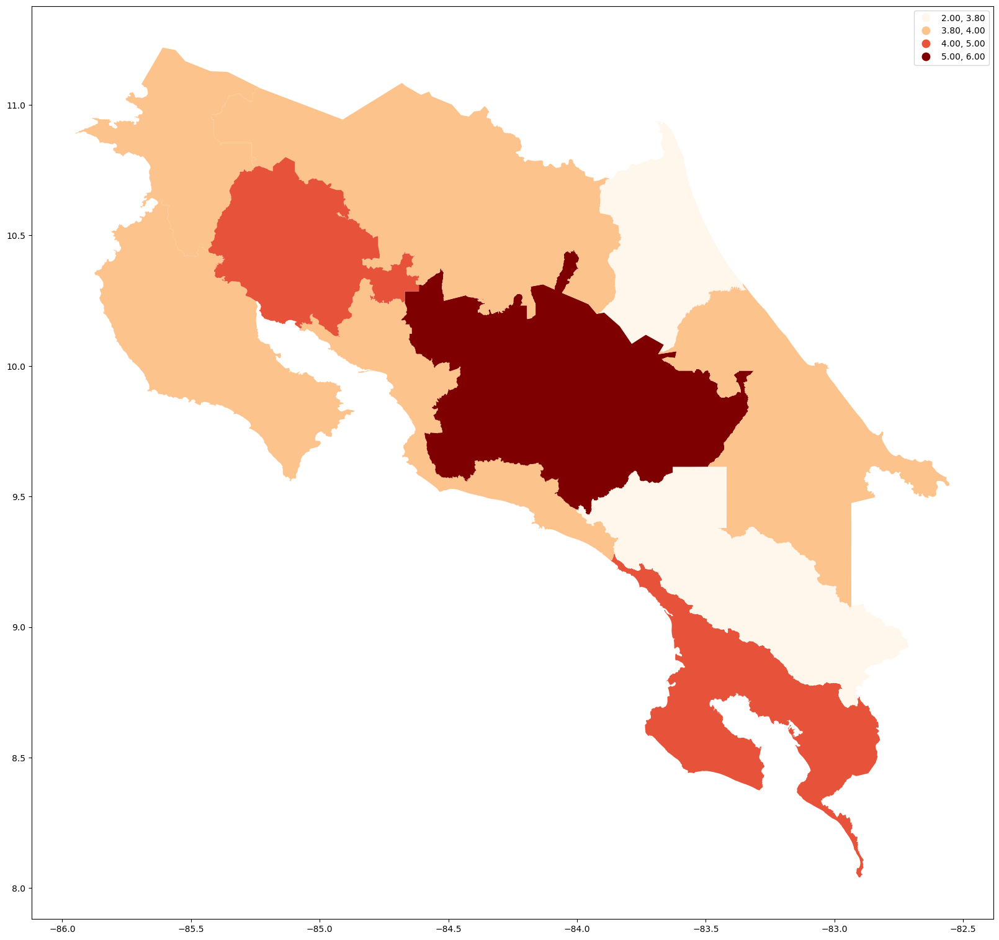

In [8]:
# Mapa estático
areas_conservacion_wgs84_gdf.plot(
    column="especies_felidos", 
    legend=True,
    cmap='OrRd', 
    scheme='quantiles',
    figsize=(20, 20)
)

In [9]:
# Crear el mapa interactivo con las áreas de conservación
m = areas_conservacion_wgs84_gdf.explore(
    column='especies_felidos',
    name='Riqueza de especies de félidos',
    cmap='OrRd',
    tooltip=['nombre_ac', 'siglas_ac', 'especies_felidos'],
    legend=True,
    legend_kwds={
        'caption': "Riqueza de especies de félidos en áreas de conservación", 
        'orientation': "horizontal"
    },
)

# Añadir los registros de félidos al mapa
felidos_gdf.explore(
    m=m, # se usa el mapa que se creó en la instrucción anterior
    name='Registros de presencia de félidos',
    marker_type='circle',
    marker_kwds={'radius': 20, 'color': 'black'},
    tooltip=['species'],
    popup=True
)

# Agregar un control de capas al mapa
folium.LayerControl().add_to(m)

# Mostrar el mapa interactivo
m

## Ejercicios

1. Programe un mapa interactivo de coropletas que muestre la cantidad de aeródromos en los cantones de Costa Rica. Busque las fuentes de datos en el SNIT.